In [ ]:
#we need imgaug 0.4 for image augmentations to work properly, see https://stackoverflow.com/questions/62580797/in-colab-doing-image-data-augmentation-with-imgaug-is-not-working-as-intended
!pip uninstall -y imgaug && pip uninstall -y albumentations && pip install imgaug==0.4
!git clone https://github.com/AIWintermuteAI/aXeleRate.git
import sys
sys.path.append('/content/aXeleRate')
from axelerate import setup_training, setup_inference

Found existing installation: imgaug 0.4.0
Uninstalling imgaug-0.4.0:
  Successfully uninstalled imgaug-0.4.0
  Using cached imgaug-0.4.0-py2.py3-none-any.whl (948 kB)
fatal: destination path 'aXeleRate' already exists and is not an empty directory.


/usr/local/lib/python3.7/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `ContrastNormalization()` is deprecated. Use `imgaug.contrast.LinearContrast` instead.
  warn_deprecated(msg, stacklevel=3)


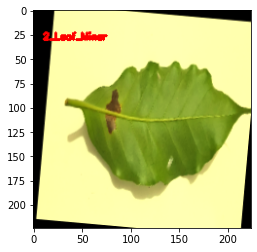

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/2_Leaf_Miner/795.jpg


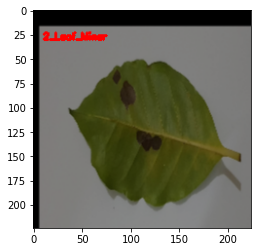

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/2_Leaf_Miner/699.jpg


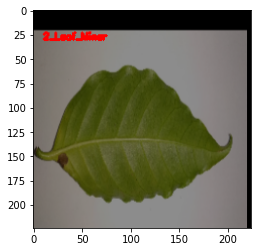

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/2_Leaf_Miner/1504.jpg


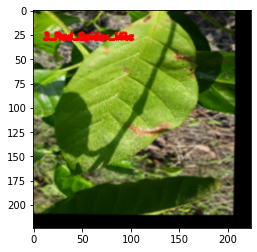

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/3_Red_Spider_Mite/C3P9H2.jpg


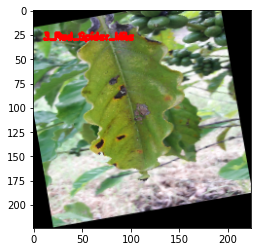

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/3_Red_Spider_Mite/C11P19H2.jpg


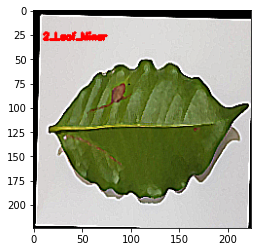

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/2_Leaf_Miner/762.jpg


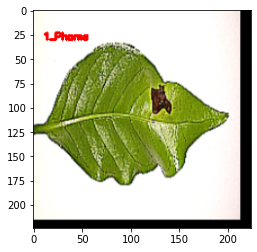

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/1_Phoma/356.jpg


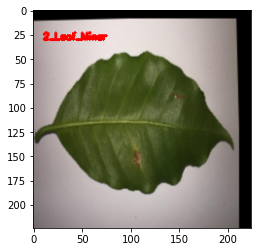

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/2_Leaf_Miner/1139.jpg


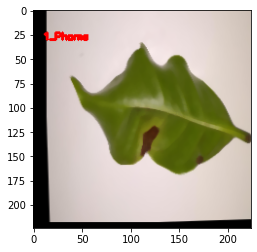

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/1_Phoma/503.jpg


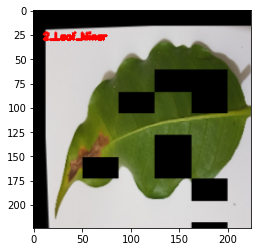

/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation/2_Leaf_Miner/868.jpg


In [ ]:
%matplotlib inline

from axelerate.networks.common_utils.augment import visualize_classification_dataset

visualize_classification_dataset('/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation', num_imgs=10, img_size=224, augment=True)

In [ ]:
config = {#Treinar o modelo do zero, caso demore muito você pode treinar durante um tempo, e um arquivo .h5 vai ser salvo no diretorio especificado
          #use o código abaixo para "continuar o treinamento"
    "model" : {
        "type":                 "Classifier",
        "architecture":         "MobileNet5_0",#modelo maior
        "input_size":           224,
        "fully-connected":      [],
        "labels":               [],
        "dropout" : 		0.2
    },
     "weights" : {
            "full":   				"",
            "backend":   		    "imagenet",
            "save_bottleneck":      False
        
    },
    "train" : {
        "actual_epoch":         30,
        "train_image_folder":   "/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/train",
        "train_times":          1,
        "valid_image_folder":   "/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation",
        "valid_times":          1,
        "valid_metric":         "val_accuracy",
        "batch_size":           16,   #mudei de 32 para 50 para tentar treinar mais rapido, treina de 32 em 32, tentar usar um tamanho 
                                      # que resulte em um num. inteiro, ex. dataset com 64 fotos, 32 iria resultar em 2 batchs, mas 30 iria sobrar
        "learning_rate":        1e-3, #Mudei de 1e-3 -> tentar treinar mais rapido
        "saved_folder":   		F"/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3",
        "first_trainable_layer": "",
        "augumentation":				True
    },
    "converter" : {
        "type":   				["k210"]
    }
}

In [ ]:
config = {#Treinar o modelo do zero, caso demore muito você pode treinar durante um tempo, e um arquivo .h5 vai ser salvo no diretorio especificado
          #use o código abaixo para "continuar o treinamento"
    "model" : {
        "type":                 "Classifier",
        "architecture":         "MobileNet5_0",#modelo maior
        "input_size":           224,
        "fully-connected":      [],
        "labels":               [],
        "dropout" : 		0.2
    },
     "weights" : {
            "full":   				"/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/2021-09-02_12-32-52/Classifier_best_val_accuracy.h5",
            "backend":   		    "imagenet",
            "save_bottleneck":      False
        
    },
    "train" : {
        "actual_epoch":         30,
        "train_image_folder":   "/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/train",
        "train_times":          1,
        "valid_image_folder":   "/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation",
        "valid_times":          1,
        "valid_metric":         "val_accuracy",
        "batch_size":           16,   #mudei de 32 para 50 para tentar treinar mais rapido, treina de 32 em 32, tentar usar um tamanho 
                                      # que resulte em um num. inteiro, ex. dataset com 64 fotos, 32 iria resultar em 2 batchs, mas 30 iria sobrar
        "learning_rate":        1e-3, #Mudei de 1e-3 -> tentar treinar mais rapido
        "saved_folder":   		F"/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3",
        "first_trainable_layer": "",
        "augumentation":				True
    },
    "converter" : {
        "type":   				["k210"]
    }
}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs
!sleep 10

<IPython.core.display.Javascript object>

In [ ]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 16380098006284246092
 xla_global_id: -1, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 11320098816
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 6571195879131994389
 physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"
 xla_global_id: 416903419]

In [ ]:
from keras import backend as K 
K.clear_session()
model_path = setup_training(config_dict=config)

Project folder /content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3 already exists. Creating a folder for new training session.
K210 Converter ready
Classifier
Successfully loaded imagenet backend weights
Failed to load pre-trained weights for the whole model. It might be because you didn't specify any or the weight file cannot be found
Found 7308 images belonging to 4 classes.
Found 421 images belonging to 4 classes.
0_Cercospora
1_Phoma
2_Leaf_Miner
3_Red_Spider_Mite
Current training session folder is /content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/2021-11-10_12-24-56




/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/content/aXeleRate/axelerate/networks/common_utils/fit.py:129: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  use_multiprocessing = True)


Model: "classifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1_pad (ZeroPadding2D)   (None, 226, 226, 3)       0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 16)      432       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 16)     64        
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 16)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 16)     144       
                                                        

/usr/local/lib/python3.7/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `ContrastNormalization()` is deprecated. Use `imgaug.contrast.LinearContrast` instead.
  warn_deprecated(msg, stacklevel=3)


Epoch 1/30
457/457 [==============================] - ETA: 0s - loss: 0.7443 - accuracy: 0.6999
Epoch 00001: val_accuracy improved from -inf to 0.87411, saving model to /content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/2021-11-10_12-24-56/Classifier_best_val_accuracy.h5
Epoch 00000: Learning rate is 0.0003326039387308534.

457/457 [==============================] - 477s 1s/step - loss: 0.7443 - accuracy: 0.6999 - val_loss: 0.3685 - val_accuracy: 0.8741
Epoch 2/30
457/457 [==============================] - ETA: 0s - loss: 0.3220 - accuracy: 0.8819
Epoch 00002: val_accuracy did not improve from 0.87411
Epoch 00001: Learning rate is 0.0006659372720641867.

457/457 [==============================] - 135s 294ms/step - loss: 0.3220 - accuracy: 0.8819 - val_loss: 0.4411 - val_accuracy: 0.8527
Epoch 3/30
457/457 [==============================] - ETA: 0s - loss: 0.2721 - accuracy: 0.9023
Epoch 00003: val_accuracy did not improve from 0.87411
Epoch 00002: Learning rate is 0.0

/usr/local/lib/python3.7/dist-packages/keras/backend.py:414: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/2021-11-10_12-24-56/Classifier_best_val_accuracy.kmodel
/content/aXeleRate/axelerate/networks/common_utils/ncc/ncc compile "/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/2021-11-10_12-24-56/Classifier_best_val_accuracy.tflite" "/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/2021-11-10_12-24-56/Classifier_best_val_accuracy.kmodel" -i tflite --weights-quantize-threshold 1000 --dataset-format raw --dataset "/content/aXeleRate/axelerate/networks/common_utils/tmp"
1. Import graph...

2. Optimize Pass 1...

3. Optimize Pass 2...

4. Quantize...

  4.1. Add quantization checkpoints...

  4.2. Get activation ranges...

  Plan buffers...

  Run calibration...

  [>                                                 ] 0% 0s

  [>                                                 ] 0% 0.306s

  [>                                                 ] 0% 0.607s

  [>                            

In [ ]:
from axelerate import setup_evaluation
setup_evaluation(config= config, weights= model_path)

Folder /content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/2021-11-10_12-24-56/Evaluation_results is created.
Classifier
Loading pre-trained weights for the whole model:  /content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/2021-11-10_12-24-56/Classifier_best_val_accuracy.h5
0_Cercospora:0.8389343619346619
0_Cercospora:0.9755128026008606
0_Cercospora:0.9917144179344177
0_Cercospora:0.9876177906990051
0_Cercospora:0.9999971389770508
2_Leaf_Miner:0.8483012318611145
2_Leaf_Miner:0.9268693923950195
2_Leaf_Miner:0.9987537860870361
2_Leaf_Miner:0.6272677183151245
2_Leaf_Miner:0.9922986626625061
2_Leaf_Miner:0.9700040817260742
0_Cercospora:0.9651714563369751
0_Cercospora:0.9999815225601196
0_Cercospora:0.9998807907104492
0_Cercospora:0.9999979734420776
1_Phoma:0.9992156028747559
0_Cercospora:0.9836844205856323
0_Cercospora:0.9893292784690857
0_Cercospora:0.9679857492446899
0_Cercospora:0.99997878074646
0_Cercospora:0.9999960660934448
0_Cercospora:0.99999499320

In [ ]:
import pandas as pd
import numpy as np
#Copiei o resultado acima e criei um arquivo csv
inf = pd.read_csv('/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/inference2.csv')

In [ ]:
inf.head()

,0_Cercospora:0.8389343619346619,0_Cercospora:0.9755128026008606,0_Cercospora:0.9917144179344177,0_Cercospora:0.9876177906990051,0_Cercospora:0.9999971389770508,2_Leaf_Miner:0.8483012318611145,2_Leaf_Miner:0.9268693923950195,2_Leaf_Miner:0.9987537860870361,2_Leaf_Miner:0.6272677183151245,2_Leaf_Miner:0.9922986626625061,2_Leaf_Miner:0.9700040817260742,0_Cercospora:0.9651714563369751,0_Cercospora:0.9999815225601196,0_Cercospora:0.9998807907104492,0_Cercospora:0.9999979734420776,1_Phoma:0.9992156028747559,0_Cercospora:0.9836844205856323,0_Cercospora:0.9893292784690857,0_Cercospora:0.9679857492446899,0_Cercospora:0.99997878074646,0_Cercospora:0.9999960660934448,0_Cercospora:0.9999949932098389,2_Leaf_Miner:0.8268980383872986,0_Cercospora:0.9997854828834534,0_Cercospora:0.9999362230300903,0_Cercospora:0.999982476234436,0_Cercospora:0.9982149600982666,0_Cercospora:0.999984860420227,0_Cercospora:0.999955415725708,0_Cercospora:0.9638840556144714,0_Cercospora:0.9999614953994751,0_Cercospora:0.9999306201934814,0_Cercospora:0.9997946619987488,0_Cercospora:0.9999823570251465,0_Cercospora:0.9970588684082031,2_Leaf_Miner:0.5334492921829224,0_Cercospora:0.9997218251228333,0_Cercospora:0.9999632835388184,0_Cercospora:0.9999803304672241,0_Cercospora:0.918672502040863,...,2_Leaf_Miner:0.9999908208847046,2_Leaf_Miner:0.9985520243644714,2_Leaf_Miner:0.9855524897575378,2_Leaf_Miner:1.0.34,2_Leaf_Miner:0.9999649524688721,2_Leaf_Miner:0.9999943971633911,2_Leaf_Miner:0.9998537302017212,2_Leaf_Miner:1.0.35,2_Leaf_Miner:0.9999991655349731.4,2_Leaf_Miner:0.9999997615814209.9,2_Leaf_Miner:1.0.36,2_Leaf_Miner:1.0.37,2_Leaf_Miner:0.9999998807907104.10,3_Red_Spider_Mite:0.9999996423721313,3_Red_Spider_Mite:1.0,3_Red_Spider_Mite:0.999981164932251,3_Red_Spider_Mite:1.0.1,3_Red_Spider_Mite:1.0.2,3_Red_Spider_Mite:0.9999990463256836,3_Red_Spider_Mite:0.9999973773956299,3_Red_Spider_Mite:1.0.3,3_Red_Spider_Mite:0.9999978542327881,3_Red_Spider_Mite:0.9999998807907104,3_Red_Spider_Mite:0.9999858140945435,3_Red_Spider_Mite:1.0.4,3_Red_Spider_Mite:0.9999992847442627,3_Red_Spider_Mite:1.0.5,3_Red_Spider_Mite:0.9999998807907104.1,3_Red_Spider_Mite:0.9999996423721313.1,3_Red_Spider_Mite:0.9992660880088806,3_Red_Spider_Mite:0.9999904632568359,3_Red_Spider_Mite:0.9775369167327881,3_Red_Spider_Mite:0.999996542930603,3_Red_Spider_Mite:0.9999998807907104.2,3_Red_Spider_Mite:1.0.6,3_Red_Spider_Mite:0.9999998807907104.3,3_Red_Spider_Mite:0.999686598777771,3_Red_Spider_Mite:0.9999585151672363,3_Red_Spider_Mite:0.9999998807907104.4,3_Red_Spider_Mite:0.9999974966049194


In [ ]:
vet_res = []
for i in range(421):
    vet_res.append(inf.columns[i][0])

In [ ]:
print(vet_res)

['0', '0', '0', '0', '0', '2', '2', '2', '2', '2', '2', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '2', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '2', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '1', '1', '1', '1', '2', '1', '1', '1', '1', '1', '2', '2', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1',

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

val_data_path = '/content/drive/MyDrive/big_dataet_coffee_leaf/data/Augmented/stage_3/validation'
val_datagen = ImageDataGenerator()

In [ ]:
val_generator = val_datagen.flow_from_directory(val_data_path,
                                                        target_size=(224, 224),
                                                        shuffle = False,
                                                        class_mode='categorical',
                                                        batch_size=5)

Found 421 images belonging to 4 classes.


In [ ]:
target_names = []

for key in val_generator.class_indices:

    target_names.append(key)

print(target_names)

['0_Cercospora', '1_Phoma', '2_Leaf_Miner', '3_Red_Spider_Mite']


In [ ]:
y_true = val_generator.classes
print('Tamanho: {}'.format(y_true.size))
print(str(y_true))

Tamanho: 421
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3]


In [ ]:
y_true_str = []
for i in range(421):
  y_true_str.append(str(y_true[i]))

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from keras import backend as K

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
print('Confusion Matrix')
cm =confusion_matrix(y_true= y_true_str, y_pred=vet_res)
cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['Cercospora', 'Phoma', 'Leaf Miner', 'Red S. Mite'])

Confusion Matrix


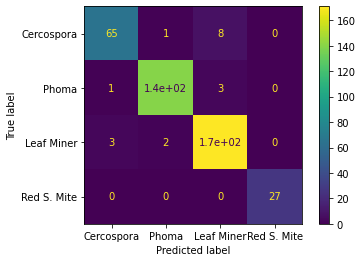

In [ ]:
cmd_obj.plot()

In [ ]:
cmd_obj.ax_.set(
                title='Matriz de confusão', 
                xlabel='Predições', 
                ylabel='Classe real')
plt.show()

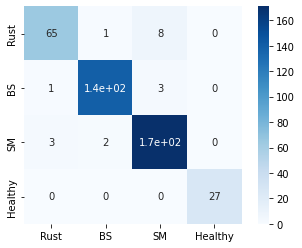

In [ ]:
import seaborn as sn

cm2 = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

sn.heatmap(cm, annot=True, square=True, cmap=plt.cm.Blues,
            xticklabels=['Rust', 'BS', 'SM', 'Healthy'],
            yticklabels=['Rust', 'BS', 'SM', 'Healthy'])

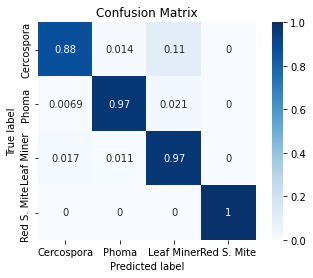

In [ ]:
import seaborn as sn

cm2 = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

sn.heatmap(cm2, annot=True, square=True, cmap=plt.cm.Blues,
            xticklabels=['Cercospora', 'Phoma', 'Leaf Miner', 'Red S. Mite'],
            yticklabels=['Cercospora', 'Phoma', 'Leaf Miner', 'Red S. Mite'])


plt.title("Confusion Matrix")
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [ ]:
print('Classification Report')
target_names = ['Cercospora', 'Phoma', 'Leaf_Miner', 'Red_Spider_Mite']
print(classification_report(y_true_str, vet_res, target_names=target_names))

Classification Report
                 precision    recall  f1-score   support

     Cercospora       0.94      0.88      0.91        74
          Phoma       0.98      0.97      0.98       144
     Leaf_Miner       0.94      0.97      0.96       176
Red_Spider_Mite       1.00      1.00      1.00        27

       accuracy                           0.96       421
      macro avg       0.97      0.96      0.96       421
   weighted avg       0.96      0.96      0.96       421

